In [1]:
import h5py
import matplotlib.pyplot as plt
import numpy as np

In [2]:
data_loc = "D:/Beam Characterization/2019_2_22/"
fname = "scanning_2019_2_22.h5"

In [3]:
with h5py.File(data_loc+fname, 'r') as f:
    print(list(f.values()))

[<HDF5 group "/1550773250 scan qswitchdelay 112us run1" (1 members)>, <HDF5 group "/1550782394 scan qswitchdelay 112us run2" (1 members)>, <HDF5 group "/1550788252 scan qswitchdelay 112us run3" (1 members)>, <HDF5 group "/1550788550 scan qswitchdelay 112us run3" (1 members)>, <HDF5 group "/1550788924 scan qswitchdelay 112us run5" (1 members)>, <HDF5 group "/1550790130 qswitchdelay 112us ablation spot decay" (1 members)>, <HDF5 group "/1550791455 scan qswitchdelay 112us run6" (1 members)>, <HDF5 group "/1550791773 qswitchdelay 112us ablation spot decay 2" (1 members)>, <HDF5 group "/1550792134 qswitchdelay 112us ablation spot decay 3 same spot shut off neon a bit" (1 members)>, <HDF5 group "/1550792279 qswitchdelay 112us ablation spot decay 4" (1 members)>]


In [4]:
run_name = "/1550792279 qswitchdelay 112us ablation spot decay 4"
fast_daq = {}
with h5py.File(data_loc+fname, 'r') as f:
    grp = f[run_name]
    readout = grp['readout']
    wavemeter = readout['WA1500'].value
    for dset in readout['PXIe-5171'].items():
        fast_daq[dset[0]] = dset[1].value

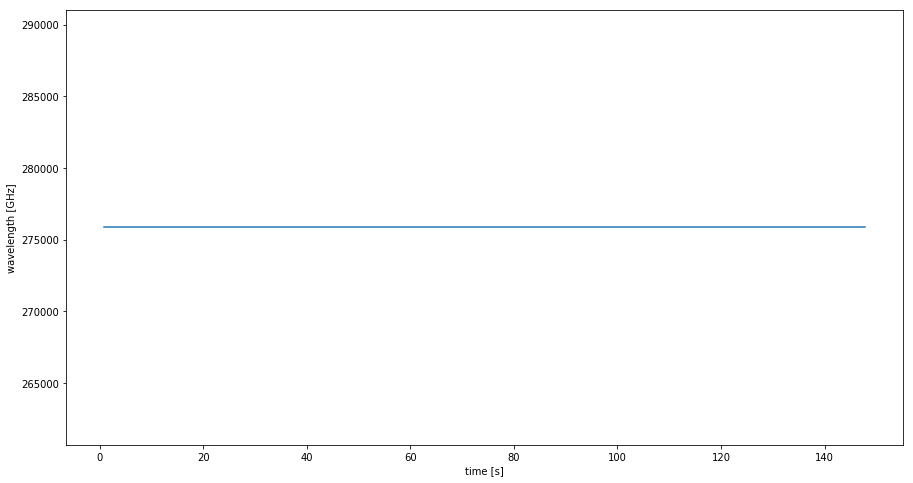

In [5]:
pfig, ax = plt.subplots(figsize = (15,8))
ax.plot(wavemeter[:,0], wavemeter[:,1]);
ax.set_xlabel('time [s]')
ax.set_ylabel('wavelength [GHz]');

# Correlation between photodiodes

[3.59145153e-01 1.30583959e+04 4.15529485e-01 1.09002973e-02
 1.80109047e-02]


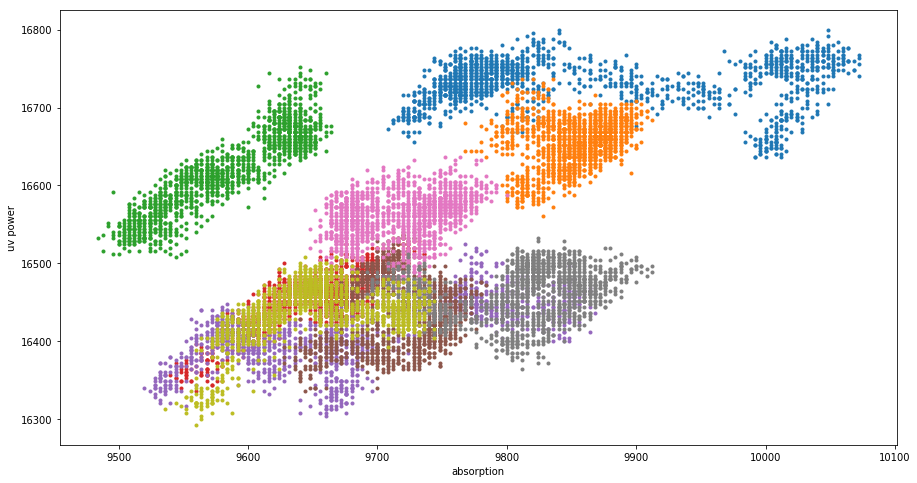

In [6]:
from scipy.stats.stats import pearsonr   
from scipy.stats import linregress

corr_abs_mon = []
fig, ax = plt.subplots(figsize = (15,8))
ax.set_xlabel("absorption")
ax.set_ylabel("uv power")
for i in range(1,10):
    corr_abs_mon.append(linregress(fast_daq['PXIe5171_{0}'.format(i)][:,1],fast_daq['PXIe5171_{0}'.format(i)][:,4]))
    ax.plot(fast_daq['PXIe5171_{0}'.format(i)][:,1],fast_daq['PXIe5171_{0}'.format(i)][:,4], '.')
print(np.mean(corr_abs_mon, axis = 0))

In [7]:
yag_fire = [idx for idx in range(1,len(fast_daq)) if fast_daq['PXIe5171_{0}'.format(idx)][:,5].max() > 12000]

595


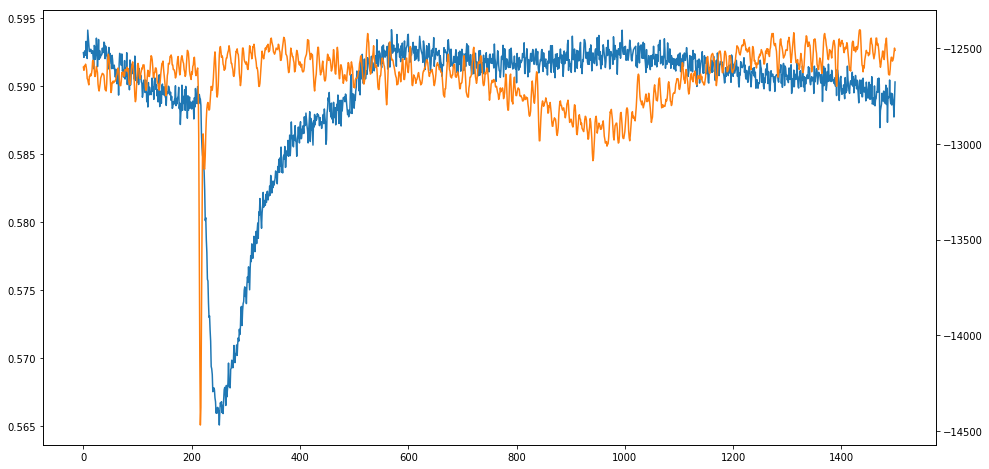

In [8]:
idx = 106
idx = yag_fire[idx]
print(idx)
fig, ax = plt.subplots(figsize = (16,8))
ax.plot(fast_daq['PXIe5171_{0}'.format(idx)][:,1]/fast_daq['PXIe5171_{0}'.format(idx)][:,4], label = 'absorption')
ax1 = ax.twinx()
ax1.plot(fast_daq['PXIe5171_{0}'.format(idx)][:,2], 'C1', label = 'fluorescence');

In [9]:
absorption_average = []
fluorescence_average = []
for idx in yag_fire[105:]:
    absorption_average.append(fast_daq['PXIe5171_{0}'.format(idx)][:,1]/fast_daq['PXIe5171_{0}'.format(idx)][:,4])
    fluorescence_average.append(fast_daq['PXIe5171_{0}'.format(idx)][:,2])
absorption_average = np.mean(np.array(absorption_average), axis = 0)
fluorescence_average = np.mean(np.array(fluorescence_average), axis = 0)

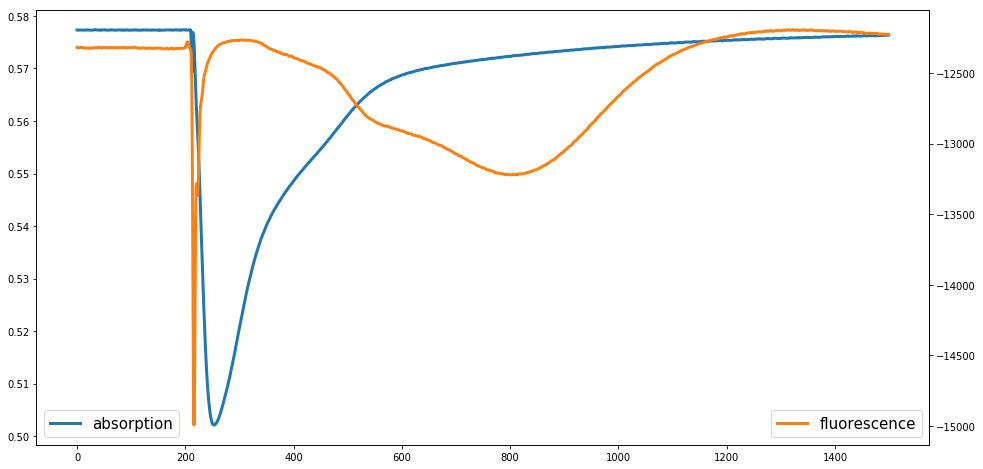

In [10]:
fig, ax = plt.subplots(figsize = (16,8))
ax.plot(absorption_average, label = 'absorption', lw = 3)
ax.legend(fontsize = 15)
ax1 = ax.twinx()
ax1.plot(fluorescence_average, 'C1', label = 'fluorescence', lw = 3)
ax1.legend(fontsize = 15)

In [11]:
def init():
    line.set_data([], [])
    line2.set_data([], [])
    return (line,line2)

def animate(idx):
    idx = yag_fire[idx]
    dat = fast_daq['PXIe5171_{0}'.format(idx)][:,1]/fast_daq['PXIe5171_{0}'.format(idx)][:,4]
    dat1 = fast_daq['PXIe5171_{0}'.format(idx)][:,2]/fast_daq['PXIe5171_{0}'.format(idx)][:,4]
    x = np.arange(0,1500,1)*0.01
    line.set_data(x,dat)
    line2.set_data(x,dat1)
    return (line,line2)

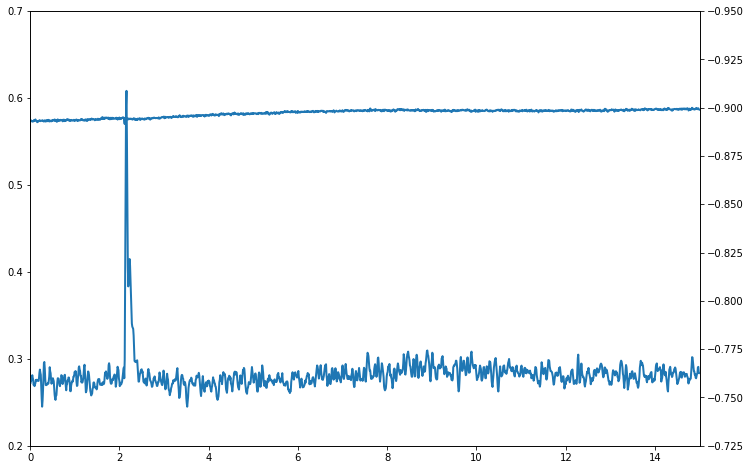

In [19]:
from matplotlib import animation, rc
from IPython.display import HTML

fig, ax = plt.subplots(figsize = (12,8))
line, = ax.plot([], [], lw=2)
ax1 = ax.twinx()
line2, = ax1.plot([], [], lw=2)
ax.set_xlim(0,1500/100)
ax.set_ylim(0.2,0.7)
ax1.set_ylim(-0.725, -0.95)
anim = animation.FuncAnimation(fig, animate, init_func=init,
                               frames=range(105,len(yag_fire)), interval=50, 
                               blit=True)
HTML(anim.to_html5_video())

In [15]:
good_runs = []
for idx in yag_fire:
    dat = fast_daq['PXIe5171_{0}'.format(idx)][:,1]/fast_daq['PXIe5171_{0}'.format(idx)][:,4]
    if (dat.mean() > 0.1):
        if (dat[215:400].min() < 0.56) and (dat[215:400].min() < dat[:100].min()) and (dat[215:400].min() < dat[400:].min()):
            good_runs.append(idx)

857


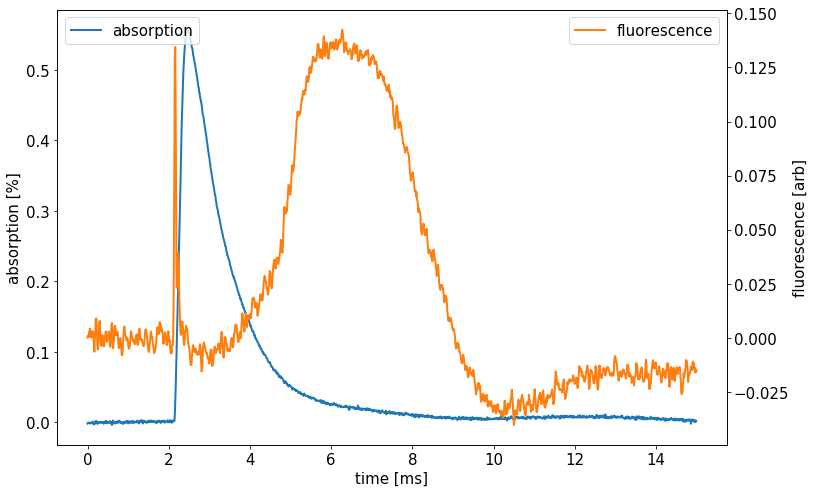

In [95]:
idx = 80
idx = good_runs[idx]

x = np.arange(0,1500,1)*0.01

fig, ax = plt.subplots(figsize = (12,8))
dat = fast_daq['PXIe5171_{0}'.format(idx)][:,1]/fast_daq['PXIe5171_{0}'.format(idx)][:,4]
dat = 2+(-dat-dat[:150].mean())/dat[:150].mean()
ax.plot(x, dat, label = 'absorption', lw = 2)

ax1 = ax.twinx()
dat1 = fast_daq['PXIe5171_{0}'.format(idx)][:,2]/fast_daq['PXIe5171_{0}'.format(idx)][:,4]*-1
dat1 -= dat1[:200].mean()
ax1.plot(x, dat1, 'C1', label = 'fluorescence', lw = 2);

ax.set_xlabel('time [ms]', fontsize = 15)
ax.set_ylabel('absorption [%]', fontsize = 15)
ax1.set_ylabel('fluorescence [arb]', fontsize = 15)
ax.tick_params(axis='both', which='major', labelsize=15)
ax.tick_params(axis='both', which='minor', labelsize=15)
ax1.tick_params(axis='both', which='major', labelsize=15)
ax1.tick_params(axis='both', which='minor', labelsize=15)

ax.legend(loc = 2, fontsize = 15);
ax1.legend(loc = 1, fontsize = 15);
fig.savefig('signal.png')

In [64]:
def init():
    line.set_data([], [])
    line2.set_data([], [])
    return (line,line2)

def animate(idx):
    idx = good_runs[idx]
    dat = fast_daq['PXIe5171_{0}'.format(idx)][:,1]/fast_daq['PXIe5171_{0}'.format(idx)][:,4]
    dat = 2+(-dat-dat[:150].mean())/dat[:150].mean()
    dat *= 100
    
    dat1 = fast_daq['PXIe5171_{0}'.format(idx)][:,2]/fast_daq['PXIe5171_{0}'.format(idx)][:,4]*-1
    dat1 -= dat1[:200].mean()
    
    x = np.arange(0,1500,1)*0.01
    line.set_data(x,dat)
    line2.set_data(x,dat1)
    return (line,line2)

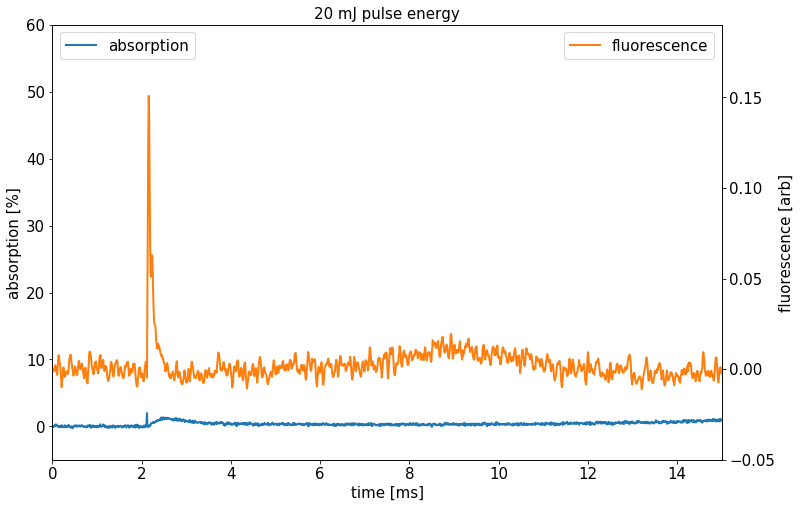

In [75]:
from matplotlib import animation, rc
from IPython.display import HTML

fig, ax = plt.subplots(figsize = (12,8))
ax.set_title('20 mJ pulse energy', fontsize = 15)
line, = ax.plot([], [], lw=2, label = 'absorption')
ax1 = ax.twinx()
line2, = ax1.plot([], [], lw=2, color = 'C1', label = 'fluorescence')
ax.set_xlim(0,1500/100)
ax.set_ylim(-5,60)
ax.set_xlabel('time [ms]', fontsize = 15)
ax.set_ylabel('absorption [%]', fontsize = 15)
ax1.set_ylabel('fluorescence [arb]', fontsize = 15)
ax.tick_params(axis='both', which='major', labelsize=15)
ax.tick_params(axis='both', which='minor', labelsize=15)
ax1.tick_params(axis='both', which='major', labelsize=15)
ax1.tick_params(axis='both', which='minor', labelsize=15)
ax1.set_ylim(-0.05, 0.19)
ax.legend(loc = 2, fontsize = 15);
ax1.legend(loc = 1, fontsize = 15);
anim = animation.FuncAnimation(fig, animate, init_func=init,
                               frames=len(good_runs), interval=20, 
                               blit=True)
HTML(anim.to_html5_video())

In [77]:
Writer = animation.writers['ffmpeg']
writer = Writer(fps=50, metadata=dict(artist='Me'), bitrate=3600)
anim.save('ablation.mp4', writer = writer)